# SatLomas: Modelo U-Net + PeruSat-1 (categorical cross entropy)

In [4]:
from unetseg.train import TrainConfig, train
from unetseg.predict import PredictConfig, predict
import os

In [5]:
BASE_DIR = os.path.join(os.path.expanduser('~'), 'data', 'lomas', 'ps1')

## Preparación del dataset

Las escenas originales de PeruSat-1 fueron preprocesadas a una imagen RGB *pansharpened*. Luego se generaron chips (imágenes cuadradas) de 320x320 píxeles, sobre las áreas donde se anotaron con polígonos (definidos sobre el archivo vectorial AOI).

```bash
satproc_extract_chips \
    -v --size 320 --step-size 160 \
    -o $BASE_DIR/train/320_160/ \
    --bands 1 2 3 \
    --classes C U D \
    --labels $BASE_DIR/train/raw/all.shp \
    --aoi $BASE_DIR/train/raw/all.shp \
    $BASE_DIR/train/raw/CARABAYLLO_20200509_clip_rgb.tif \
    $BASE_DIR/train/raw/MANGOMARCA_20200422_clip_rgb.tif
```

In [5]:
!tree -d $BASE_DIR/train/

/home/ro/data/lomas/ps1/train/
├── 320_160
│   ├── images
│   └── masks
├── 320_320
│   └── images
└── raw

6 directories


## Entrenamiento

In [6]:
config = TrainConfig(width=320,
                     height=320,
                     n_channels=3,
                     n_classes=3,
                     apply_image_augmentation=True,
                     use_categorical_crossentropy_loss=True,   # esto setea la nueva loss
                     seed=42,
                     epochs=50,
                     batch_size=32,
                     steps_per_epoch=500,
                     early_stopping_patience=10,
                     validation_split=0.1,
                     images_path=os.path.join(BASE_DIR, 'train', '320_160'),
                     model_path=os.path.join(BASE_DIR, 'weights', 'lomas_ps1_cc_v1.h5'))

In [7]:
from unetseg.evaluate import plot_data_generator

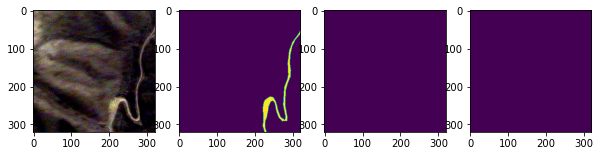

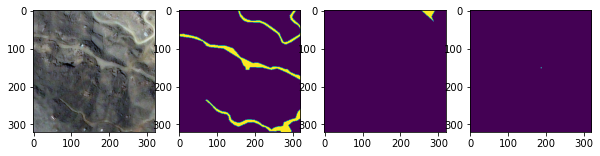

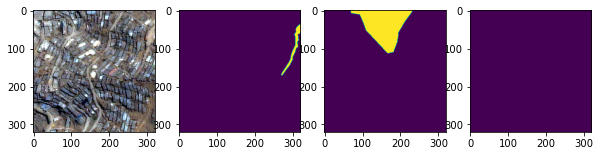

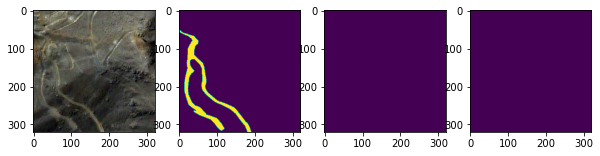

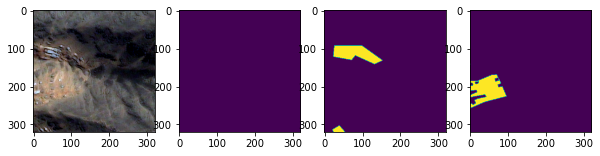

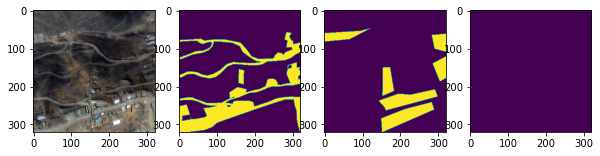

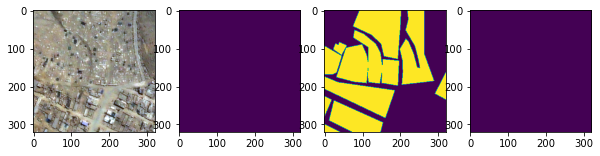

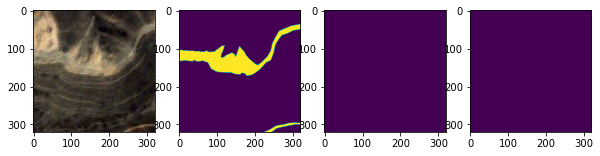

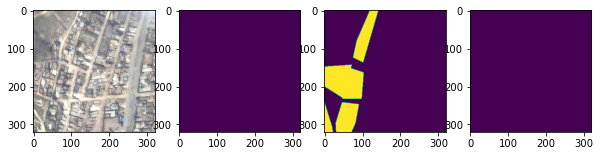

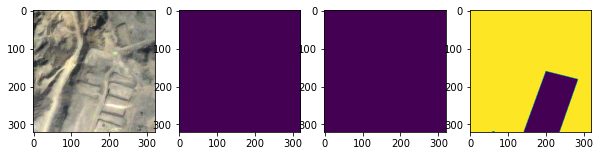

In [8]:
plot_data_generator(train_config=config, num_samples=10, fig_size=(10,6))

In [13]:
config = TrainConfig(width=320,
                     height=320,
                     n_channels=3,
                     n_classes=3,
                     apply_image_augmentation=True,
                     use_categorical_crossentropy_loss=True,   # esto setea la nueva loss
                     seed=42,
                     epochs=50,
                     batch_size=32,
                     steps_per_epoch=500,
                     early_stopping_patience=10,
                     validation_split=0.1,
                     evaluate=False,
                     images_path=os.path.join(BASE_DIR, 'train', '320_160'),
                     model_path=os.path.join(BASE_DIR, 'weights', 'lomas_ps1_cc_v1.h5'))

In [9]:
results = train(config)


Instructions for updating:
Use `tf.cast` instead.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 320, 320, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 320, 320, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 320, 320, 32) 9248        conv2d_1[0][0]                   
_________________________________________________________________


Epoch 1/50
500/500 [==============================] - 400s 799ms/step - loss: 0.2064 - accuracy: 0.8367 - mean_iou: 0.0354 - val_loss: 0.2185 - val_accuracy: 0.8614 - val_mean_iou: 0.0316

Epoch 00001: val_loss improved from inf to 0.21846, saving model to /home/ro/data/lomas/ps1/weights/lomas_ps1_cc_v1.h5
Epoch 2/50
500/500 [==============================] - 385s 771ms/step - loss: 0.2052 - accuracy: 0.8387 - mean_iou: 0.0313 - val_loss: 0.1200 - val_accuracy: 0.8598 - val_mean_iou: 0.0312

Epoch 00002: val_loss improved from 0.21846 to 0.12004, saving model to /home/ro/data/lomas/ps1/weights/lomas_ps1_cc_v1.h5
Epoch 3/50
500/500 [==============================] - 384s 769ms/step - loss: 0.2042 - accuracy: 0.8398 - mean_iou: 0.0311 - val_loss: 0.1686 - val_accuracy: 0.8650 - val_mean_iou: 0.0310

Epoch 00003: val_loss did not improve from 0.12004
Epoch 4/50
500/500 [==============================] - 387s 774ms/step - loss: 0.2049 - accuracy: 0.8388 - mean_iou: 0.0310 - val_loss: 0.19

## Predict

In [6]:
from unetseg.train import TrainConfig, train
from unetseg.predict import PredictConfig, predict
import os

In [7]:
BEST_MODEL_PATH = os.path.join(BASE_DIR, 'weights', 'lomas_ps1_cc_v1.h5')

In [9]:
predict_config = PredictConfig(
    images_path=os.path.join(BASE_DIR, 'train', '320_160'),
    results_path=os.path.join(BASE_DIR, 'train', '320_160', 'results', 'cc_v1'),
    batch_size=32,
    model_path=BEST_MODEL_PATH,
    use_categorical_crossentropy_loss=True,
    height=320,
    width=320,
    n_channels=3,
    n_classes=3)

In [10]:
predict(predict_config)

Total images to predict (/home/ro/data/lomas/ps1/train/320_160/images/*.tif): 3084
After skipping existing results: 3084

Instructions for updating:
Use `tf.cast` instead.

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.



  0%|          | 0/97 [00:00<?, ?it/s]

100%|██████████| 97/97 [00:53<00:00,  1.83it/s]

Done!


## Plots (training)

In [ ]:
import tifffile as tiff
from skimage.transform import resize
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import random
import numpy as np
from glob import glob

H = 20

images = [os.path.basename(f) for f in sorted(glob(os.path.join(predict_config.images_path, 'images', '*.tif')))]

# Sample
#images = images[:H] 
images = random.sample(images, H)

for img_file in images:
    img_ = tiff.imread(os.path.join(predict_config.images_path, 'images', img_file))[:,:,:config.n_channels]
    img_ = minmax_scale(img_.ravel(), feature_range=(0, 255)).reshape(img_.shape)
    img_ = resize(img_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True).astype(np.uint8)

    # mask
    mask_v = tiff.imread(os.path.join(config.images_path, 'masks', img_file)) / 255
    mask_v = resize(mask_v, (config.height, config.width), mode='constant', preserve_range=True)
    print("mask_v.shape", mask_v.shape)
    #mask_v = mask_v.reshape((config.height, config.width, config.n_classes))

    # Prediccion
    mask_ = tiff.imread(os.path.join(predict_config.results_path, img_file)) / 255
    mask_ = resize(mask_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True)   
    #mask_ = mask_.reshape((predict_config.height, predict_config.width, config.n_classes))
    print("mask_.shape", mask_.shape)

    fig, axes = plt.subplots(nrows=2, ncols=config.n_classes + 1, figsize=(config.n_classes * 10, 10)) 
    axes[0][0].imshow(img_)
    axes[1][0].imshow(img_)
    for c in range(config.n_classes):
        axes[0][1+c].imshow(mask_[:,:,c])
        axes[1][1+c].imshow(mask_v[:,:,c])
    plt.show()
    print("=================================================================================")

mask_v.shape (320, 320, 3)
mask_.shape (320, 320, 3)


## Predict (all)

```bash
satproc_extract_chips \
    -v --size 320 \
    -o $BASE_DIR/train/320_320/ \
    --bands 1 2 3 \
    --classes C U D \
    --aoi $BASE_DIR/train/raw/aoi.geojson \
    $BASE_DIR/train/raw/CARABAYLLO_20200509_clip_rgb.tif \
    $BASE_DIR/train/raw/MANGOMARCA_20200422_clip_rgb.tif
```

In [36]:
predict_config = PredictConfig(
    images_path=os.path.join(BASE_DIR, 'train', '320_320'),
    results_path=os.path.join(BASE_DIR, 'train', '320_320', 'results_v2'),
    batch_size=32,
    model_path=BEST_MODEL_PATH,
    height=320,
    width=320,
    n_channels=3,
    n_classes=3)
predict(predict_config)

0it [00:00, ?it/s]

Done!


## Plots (all)

mask_.shape (320, 320, 3)


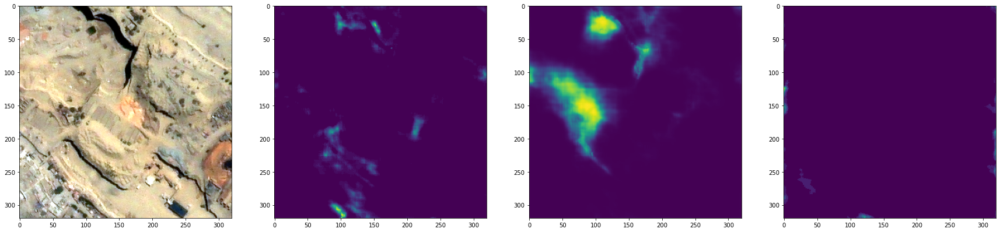

mask_.shape (320, 320, 3)


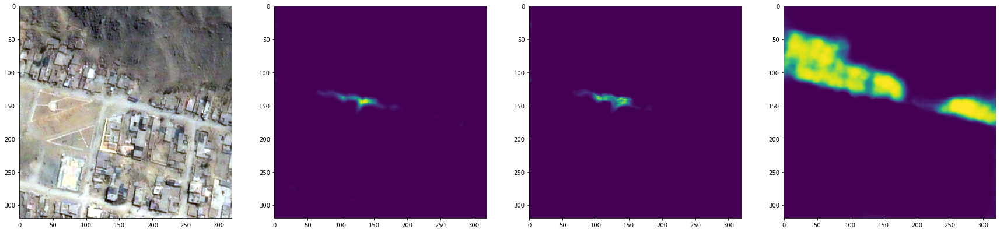

mask_.shape (320, 320, 3)


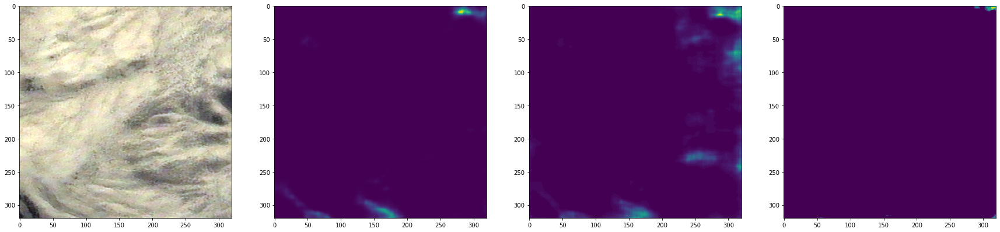

mask_.shape (320, 320, 3)


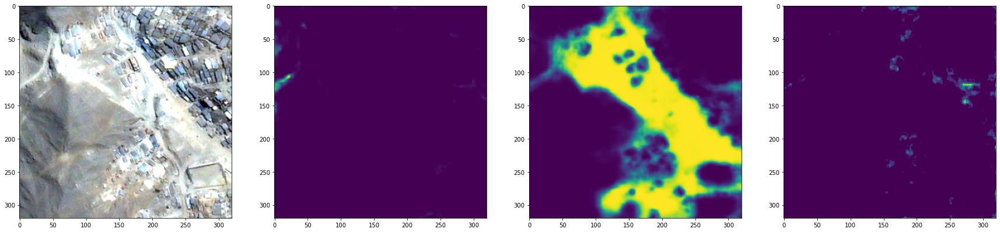

mask_.shape (320, 320, 3)


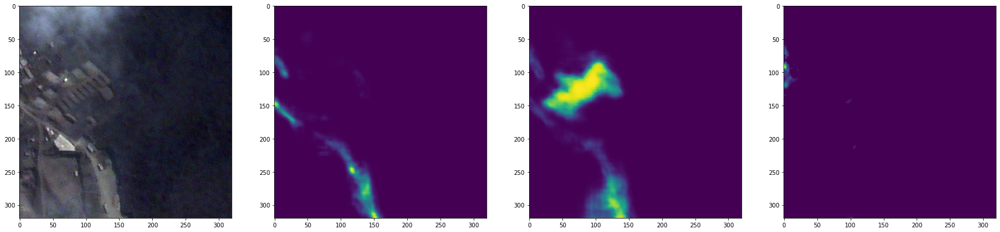

mask_.shape (320, 320, 3)


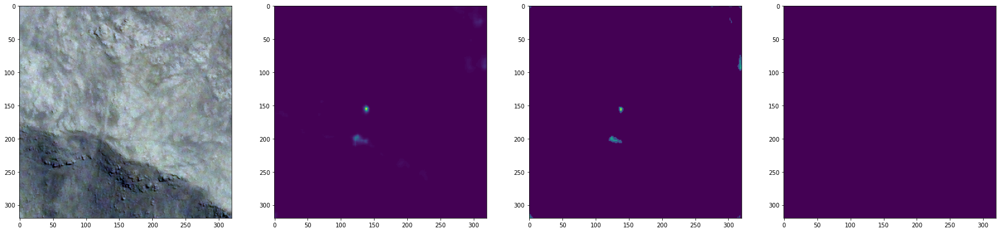

mask_.shape (320, 320, 3)


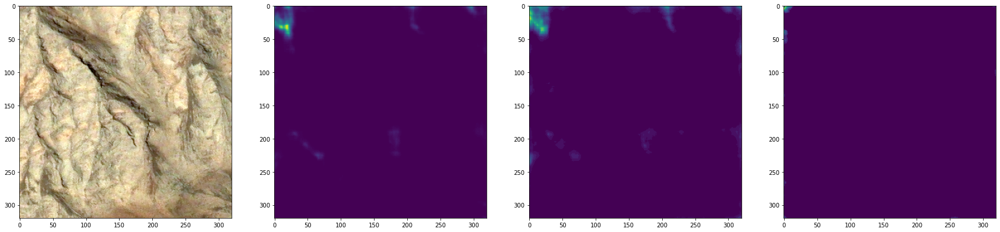

mask_.shape (320, 320, 3)


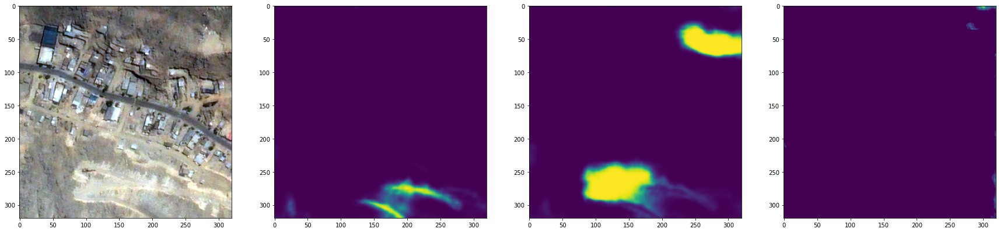

mask_.shape (320, 320, 3)


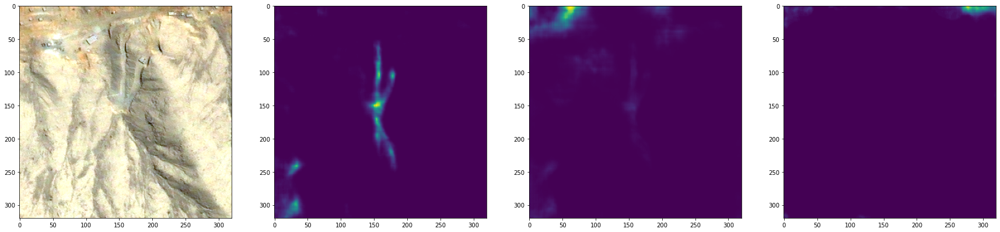

mask_.shape (320, 320, 3)


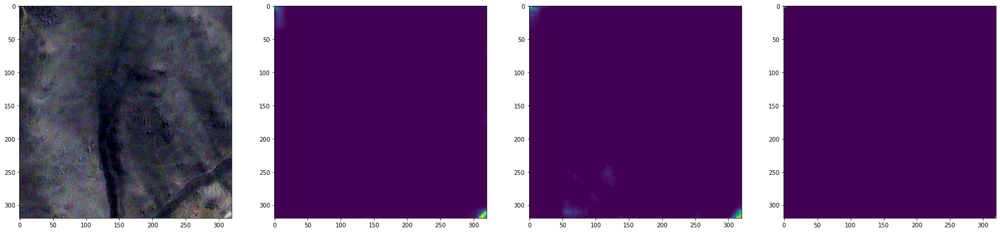

mask_.shape (320, 320, 3)


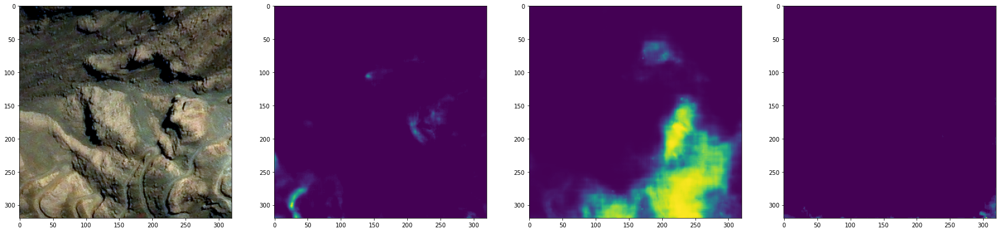

mask_.shape (320, 320, 3)


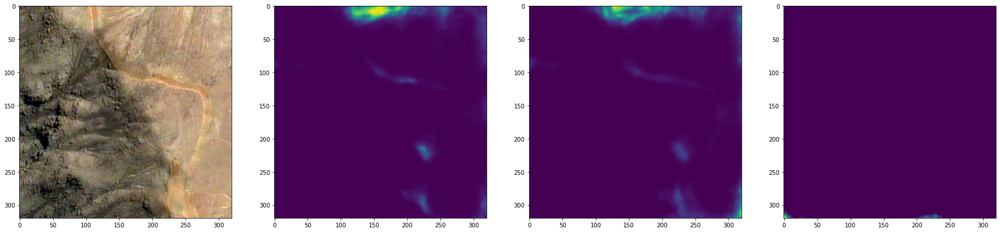

mask_.shape (320, 320, 3)


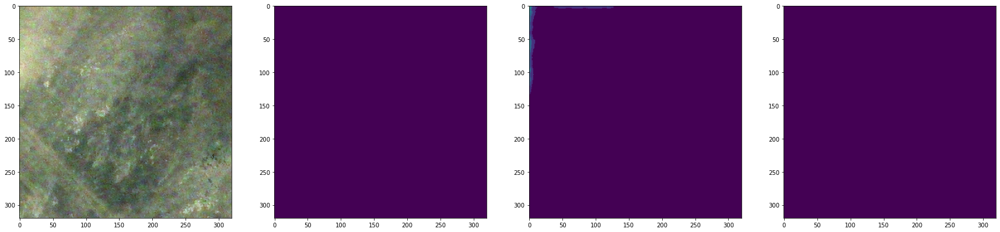

mask_.shape (320, 320, 3)


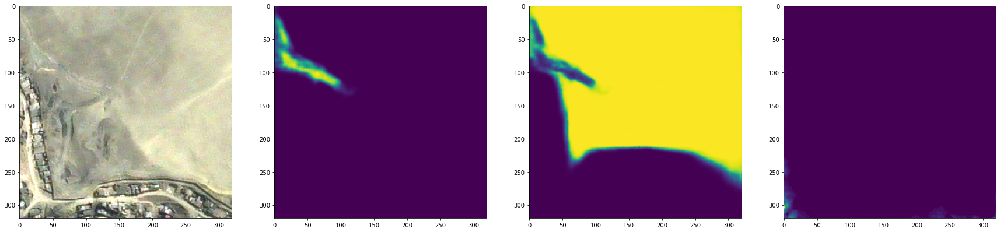

mask_.shape (320, 320, 3)


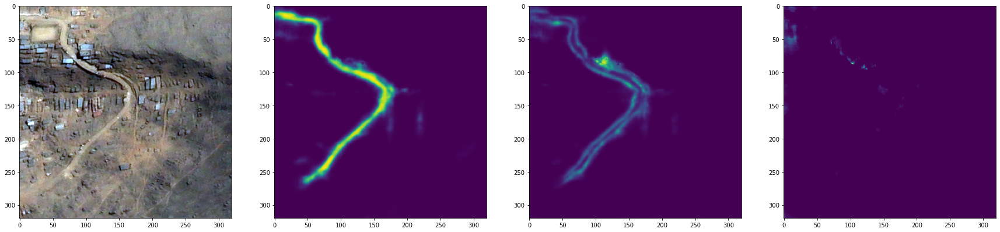

mask_.shape (320, 320, 3)


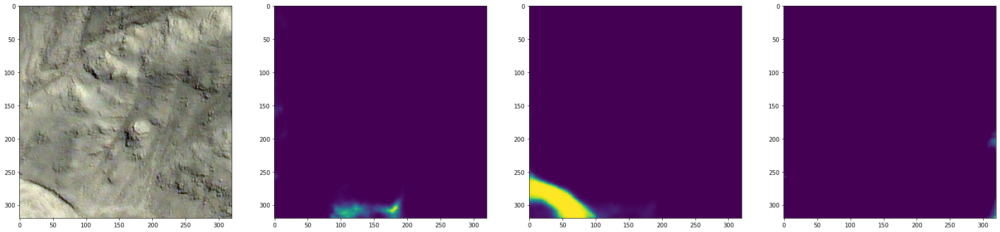

mask_.shape (320, 320, 3)


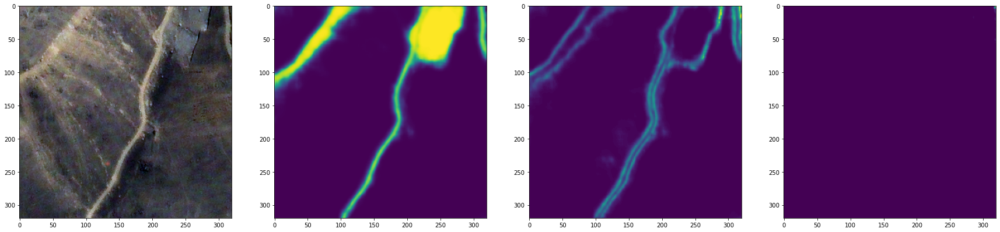

mask_.shape (320, 320, 3)


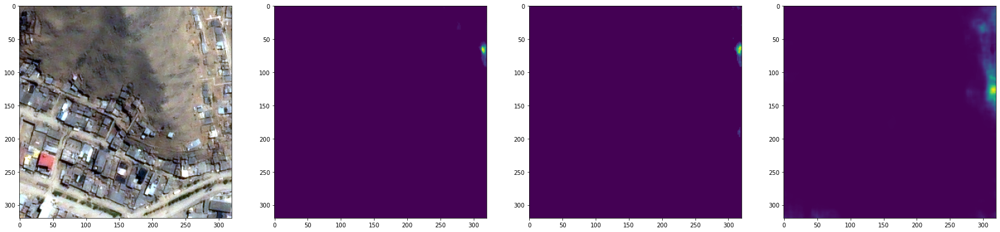

mask_.shape (320, 320, 3)


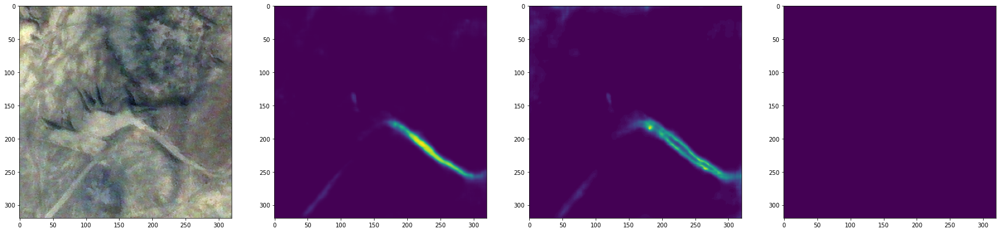

mask_.shape (320, 320, 3)


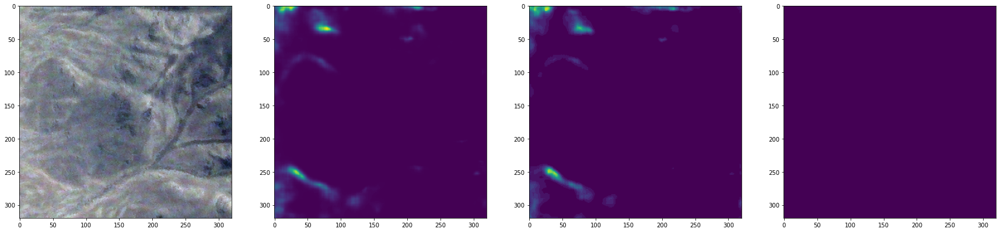

In [38]:
import tifffile as tiff
from skimage.transform import resize
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
import random
import numpy as np
from glob import glob

H = 20

images = [os.path.basename(f) for f in sorted(glob(os.path.join(predict_config.images_path, 'images', '*.tif')))]

# Sample
#images = images[:H] 
images = random.sample(images, H)

for img_file in images:
    img_ = tiff.imread(os.path.join(predict_config.images_path, 'images', img_file))[:,:,:config.n_channels]
    img_ = minmax_scale(img_.ravel(), feature_range=(0, 255)).reshape(img_.shape)
    img_ = resize(img_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True).astype(np.uint8)

    # Prediccion
    mask_ = tiff.imread(os.path.join(predict_config.results_path, img_file)) / 255
    mask_ = resize(mask_, (predict_config.height, predict_config.width), mode='constant', preserve_range=True)   
    #mask_ = mask_.reshape((predict_config.height, predict_config.width, config.n_classes))
    print("mask_.shape", mask_.shape)

    fig, axes = plt.subplots(nrows=1, ncols=config.n_classes + 1, figsize=(config.n_classes * 10, 10)) 
    axes[0].imshow(img_)
    for c in range(config.n_classes):
        axes[1+c].imshow(mask_[:,:,c])
    plt.show()
    print("=================================================================================")